In [1]:
import scanpy as sc
import numpy as np
import scanpy.external as sce
import pandas as pd
import scvelo as scv
import seaborn as sns
import matplotlib.pyplot as plt
import importlib
import sys
import symphonypy as sp

sys.path.append("/home/sergey/tools/sclitr/")
import sclitr as sl

# Figures aesthetics
sc.set_figure_params(dpi=150)

# Pathes
DATA_PATH = "/home/sergey/data/clonal_project"
HOME_PATH = "/home/sergey/projects/clonal_project"

# Additional functions
exec(open(f"{HOME_PATH}/tools/tools.py").read())
sns.set_style("ticks")

In [4]:
def create_fake_anndata(adata):
    clone_ids = adata.obs[["E7.5:clones", "E8.5:clones", "celltype_l2", "celltype_l3"]]
    clone_ids["E7.5:clones"] = [f"E7.5:{i}" if i != "NA" else "NA" for i in clone_ids["E7.5:clones"]]
    clone_ids["E8.5:clones"] = [f"E8.5:{i}" if i != "NA" else "NA" for i in clone_ids["E8.5:clones"]]
    double_clones = clone_ids[(clone_ids["E7.5:clones"] != "NA") & (clone_ids["E8.5:clones"] != "NA")]
    double_clones_cells = double_clones.index
    single_clones = clone_ids[~clone_ids.index.isin(double_clones.index)]

    single_clones["clones"] = (
        single_clones["E7.5:clones"] * (single_clones["E7.5:clones"] != "NA") +
        single_clones["E8.5:clones"] * (single_clones["E8.5:clones"] != "NA")
    ).replace("", "NA")
    del (single_clones["E7.5:clones"], single_clones["E8.5:clones"])

    double_clones = pd.concat([
        pd.DataFrame(np.matrix(double_clones.values[:, [0, 2, 3]]), index=double_clones.index + "_0",  columns=double_clones.columns[[0, 2, 3]]),
        pd.DataFrame(np.matrix(double_clones.values[:, [0, 2, 3]]), index=double_clones.index + "_1",  columns=double_clones.columns[[1, 2, 3]])
    ]).fillna("NA")

    double_clones["clones"] = (
        double_clones["E7.5:clones"] * (double_clones["E7.5:clones"] != "NA") +
        double_clones["E8.5:clones"] * (double_clones["E8.5:clones"] != "NA")
    ).replace("", "NA")
    del (double_clones["E7.5:clones"], double_clones["E8.5:clones"])

    return sc.AnnData(
        obsm={
            "X_pca_harmony": np.concatenate([
                np.array(adata[single_clones.index].obsm["X_pca_harmony"]),
                np.array(adata[double_clones_cells].obsm["X_pca_harmony"]),
                np.array(adata[double_clones_cells].obsm["X_pca_harmony"]),
            ], axis=0)
        },
        obs=pd.concat([single_clones, double_clones]),
    )

In [5]:
def concat_clones(df):
    import random
    
    results = []
    clonecol1 = df.columns[0]
    clonecol2 = df.columns[1]
    clone_1_prefix = clonecol1.split(":")[0]
    clone_2_prefix = clonecol2.split(":")[0]
    
    for clone_1, clone_2 in zip(df[clonecol1], df[clonecol2]):
        if (clone_1 == "NA") and (clone_2 != "NA"):
            results.append(clone_2_prefix + ":" + clone_2)
        elif (clone_1 != "NA") and (clone_2 == "NA"):
            results.append(clone_1_prefix + ":" + clone_1)
        elif (clone_1 == "NA") and (clone_2 == "NA"):
            results.append("NA")
        else:
            results.append(random.choice([clone_1_prefix + ":" + clone_1, clone_2_prefix + ":" + clone_2]))
            
    return results

# Trunk

In [14]:
adata_m = sc.read_h5ad(f"{DATA_PATH}/anndatas/mesenchyme_trunk_E13_reference.h5ad")

adata_n = sc.read_h5ad(f"{DATA_PATH}/anndatas/neurons_glia_trunk_E13_reference.h5ad")

adata_o = sc.read_h5ad(f"{DATA_PATH}/anndatas/other_cells_trunk_E13_reference.h5ad")
adata_o.obs.celltype_l2 = adata_o.obs.celltype_l2.cat.rename_categories({"Doublets": "Doublet"})

adata_g = sc.read_h5ad(f"{DATA_PATH}/anndatas/glia_trunk_E13_reference.h5ad")

adata_n = adata_n[~adata_n.obs_names.isin(adata_g.obs_names)]
adata_g = adata_g[adata_g.obs.celltype_l2 != "Doublet"]
adata_o = adata_o[adata_o.obs.celltype_l2 != "Doublet"]

adata = sc.read_h5ad(f"{DATA_PATH}/anndatas/trunk_E13_reference.h5ad")
adata = adata[~adata.obs.celltype_l2.isin(["Doublets", "Doublet"])]

In [43]:
clonal_nn_kwargs = {
    "obs_name": "clones",
    "obsm_name": "X_pca_harmony",
    "min_size": 10,
}

adata_m_fake = create_fake_anndata(adata_m)
adata_g_fake = create_fake_anndata(adata_g)
adata_o_fake = create_fake_anndata(adata_o)
adata_n_fake = create_fake_anndata(adata_n)

adata_m_clonal = sl.tl.clonal_nn(adata_m_fake, **clonal_nn_kwargs)
adata_n_clonal = sl.tl.clonal_nn(adata_n_fake, **clonal_nn_kwargs)
adata_g_clonal = sl.tl.clonal_nn(adata_g_fake, **clonal_nn_kwargs)
adata_o_clonal = sl.tl.clonal_nn(adata_o_fake, **clonal_nn_kwargs)

adata_clonal = adata_m_clonal.concatenate(
    [adata_n_clonal, adata_g_clonal, adata_o_clonal],
    join="outer",
    batch_key=None,
    index_unique=None,
    fill_value=0,
)

for ct in ["celltype_l2", "celltype_l3"]:
    ct_list = []
    for adata_ in [adata_m_fake, adata_n_fake, adata_g_fake, adata_o_fake]:
        ct_list += list(adata_.obs[ct].astype(str))
    adata_clonal.obs[ct] = ct_list
    adata_clonal.obs[ct] = adata_clonal.obs[ct].astype("category")

clones = sl.tl.clone2vec(
    adata_clonal,
    obs_name=f"clones",
    device="cuda:0",
    fill_ct="celltype_l2",
)

sc.pp.neighbors(clones, use_rep="word2vec")
sc.tl.umap(clones)
clones.obs["injection_time"] = [i.split(":")[0] for i in clones.obs_names]

100%|██████████| 200/200 [42:37<00:00, 12.79s/it]


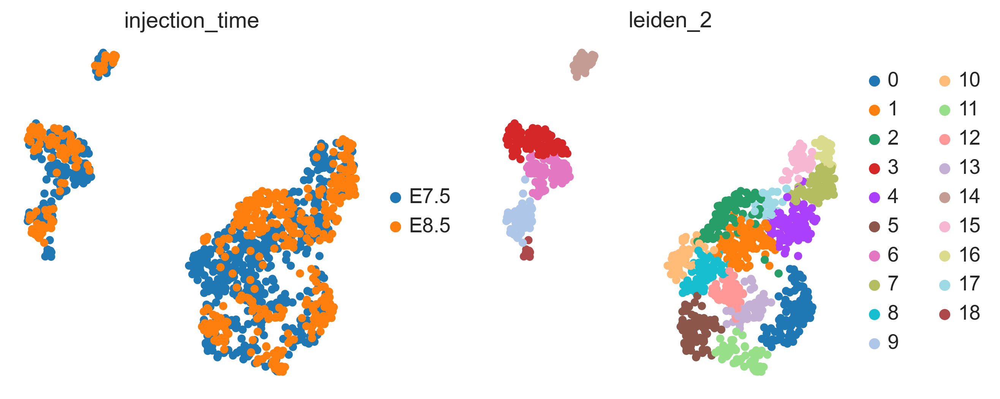

In [492]:
for resolution in [0.5, 1, 2, 3]:
    sc.tl.leiden(
        clones,
        resolution=resolution,
        key_added=f"leiden_{resolution}",
    )
sc.pl.umap(clones, color=["injection_time", "leiden_2"], frameon=False)

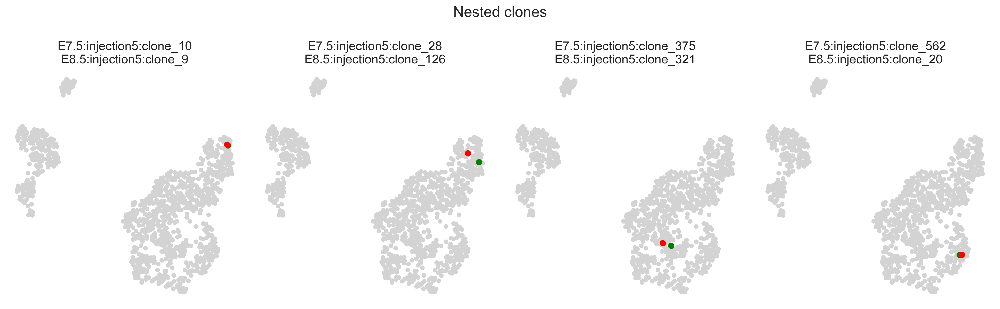

In [493]:
clonal_df = adata.obs[["E7.5:clones", "E8.5:clones"]]
clonal_df["double"] = np.array(clonal_df["E7.5:clones"]) + " + " + np.array(clonal_df["E8.5:clones"])

E7_counts = clonal_df["E7.5:clones"].value_counts()
E8_counts = clonal_df["E8.5:clones"].value_counts()

stats = {}

for injection, counts in zip(clonal_df["double"].value_counts().index, clonal_df["double"].value_counts()):
    if "NA" not in injection:
        GFP, TOM = injection.split(" + ")
        stats[injection] = {
            "(TOM and GFP) / TOM" : counts / E8_counts[TOM],
            "(TOM and GFP) / GFP" : counts / E7_counts[GFP]
        }
        
stats = pd.DataFrame(stats).T
real_DI = stats[stats["(TOM and GFP) / TOM"] > 0.5].index
real_DI = pd.DataFrame({
    "E7.5": ["E7.5:" + i.split(" + ")[0] for i in real_DI],
    "E8.5": ["E8.5:" + i.split(" + ")[1] for i in real_DI]
})

real_DI = real_DI[real_DI["E7.5"].isin(clones.obs_names) & real_DI["E8.5"].isin(clones.obs_names)]

npairs = len(real_DI)
fig, axes = plt.subplots(figsize=(4 * npairs, 5), ncols = npairs)

for i in range(npairs):
    sc.pl.umap(clones, ax=axes[i], show=False, frameon=False)
    sc.pl.umap(clones[list(real_DI.iloc[i])[0]], ax=axes[i],
               show=False, frameon=False, na_color="green", s=200)
    sc.pl.umap(clones[list(real_DI.iloc[i])[1]], ax=axes[i],  title="\n".join(list(real_DI.iloc[i])),
               show=False, frameon=False, na_color="red", s=200)
    
fig.suptitle("Nested clones")
fig.tight_layout()

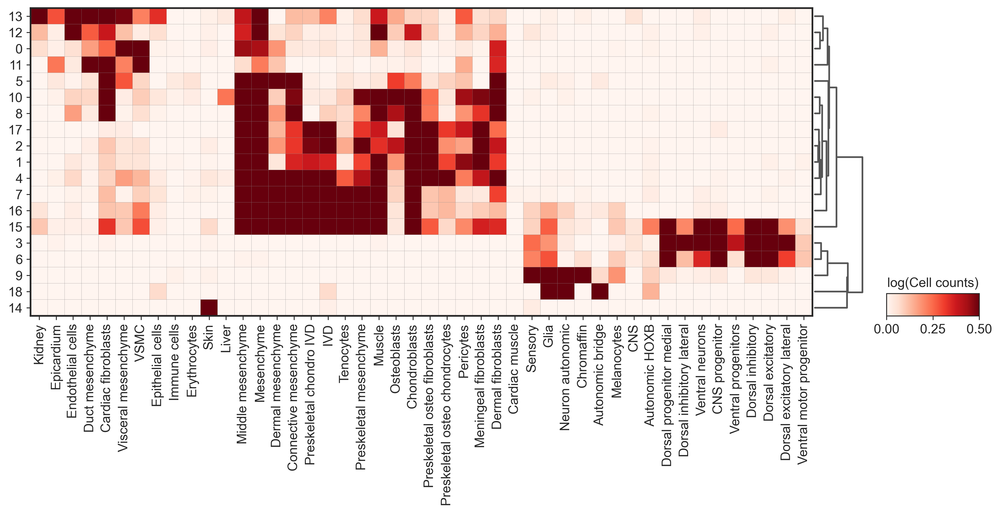

In [494]:
from scipy.cluster.hierarchy import linkage, dendrogram

ct_order = dendrogram(linkage(clones.X.T, method="average", metric="correlation"), no_plot=True)["leaves"][::-1]
sc.tl.dendrogram(
    clones,
    groupby="leiden_2",
    cor_method="spearman",
    linkage_method="centroid",
    optimal_ordering=True,
)
ax = sc.pl.matrixplot(
    clones,
    var_names=clones.var_names[ct_order],
    groupby="leiden_2",
    cmap="Reds",
    dendrogram=True,
    figsize=(15, 5),
    #standard_scale="var",
    show=False,
    log=True,
    vmax=0.5,
    colorbar_title="log(Cell counts)"
)

In [495]:
for resolution in [0.5, 1, 2, 3]: 
    clone_to_cluster = dict(zip(
        clones.obs_names,
        clones.obs[f"leiden_{resolution}"],
    ))
    clone_to_cluster["NA"] = "NA"
    for adata_ in [adata, adata_m, adata_n, adata_g, adata_o]:
        adata_.obs["clones"] = concat_clones(adata_.obs[["E7.5:clones", "E8.5:clones"]])
        adata_.obs[f"clones_clusters_{resolution}"] = [
            clone_to_cluster[clone] if clone in clone_to_cluster else "NA"
            for clone in adata_.obs["clones"] 
        ]

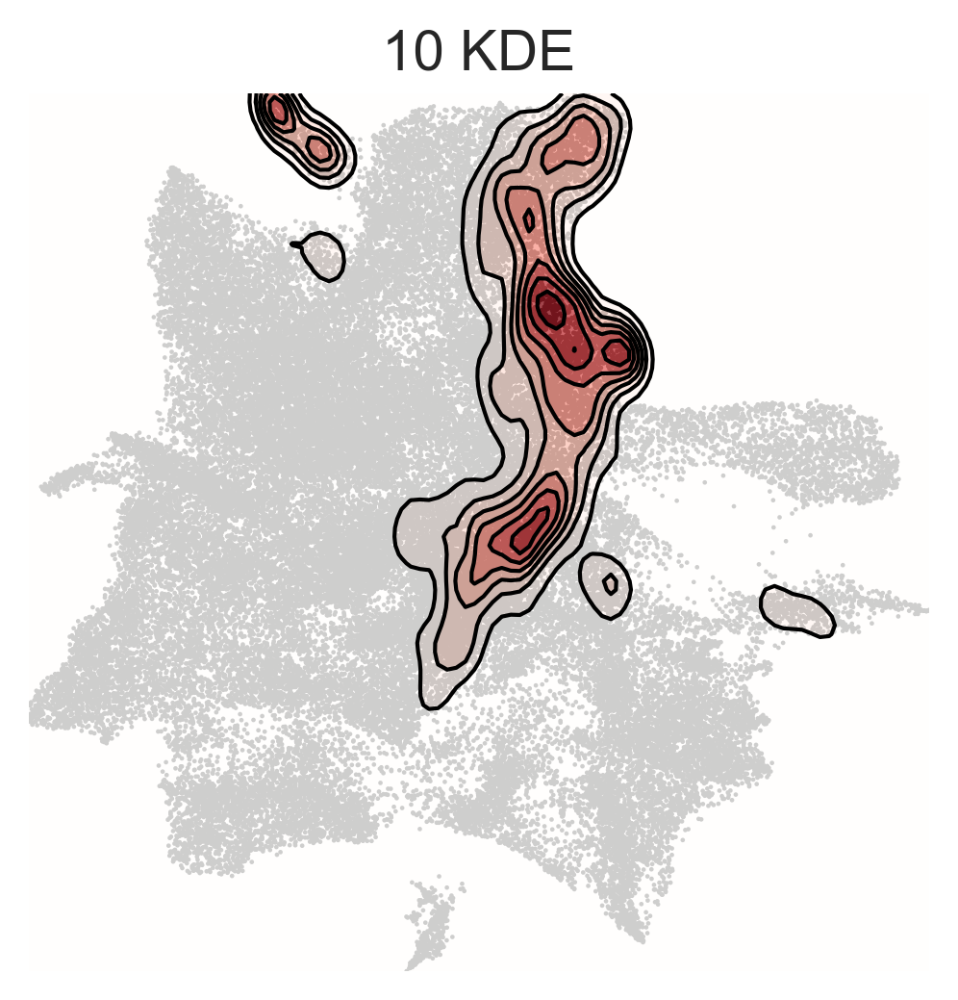

In [496]:
sl.pl.kde(
    adata_m,
    groupby=f"clones_clusters_{res}",
    group="10",
)

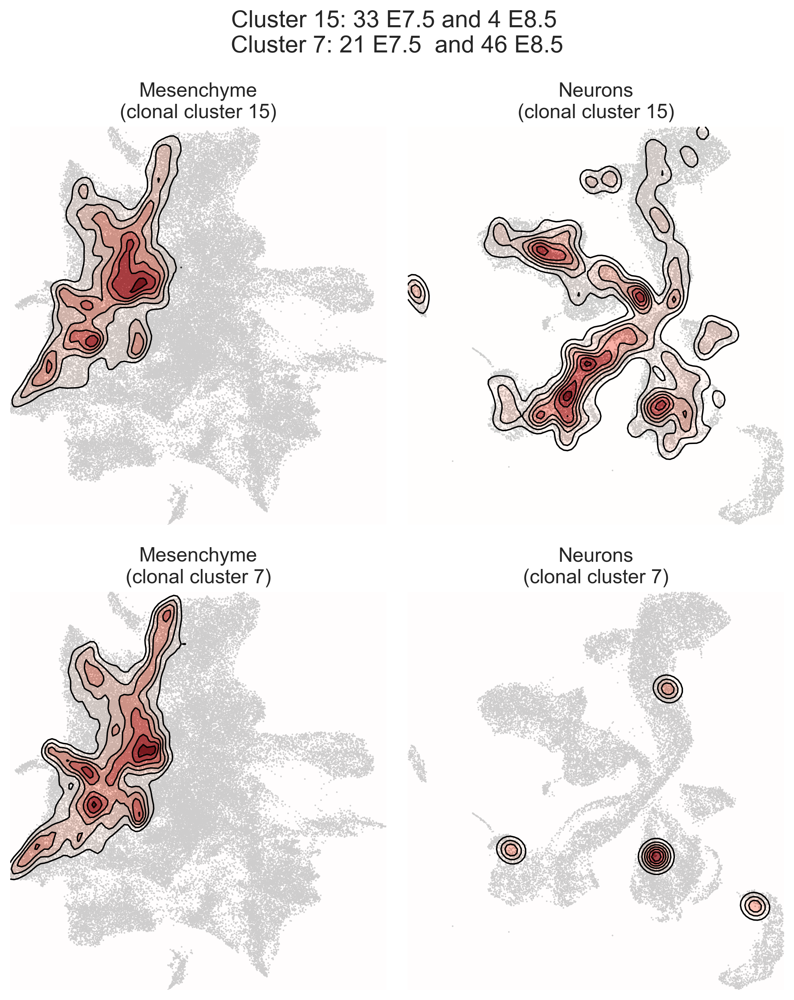

In [497]:
neuromesodermal = "15"
tail_mesodermal = "7"
res = "2"

E7_both = (clones[clones.obs_names.str.startswith("E7.5")].obs[f"leiden_{res}"] == neuromesodermal).sum()
E8_both = (clones[clones.obs_names.str.startswith("E8.5")].obs[f"leiden_{res}"] == neuromesodermal).sum()

E7_meso = (clones[clones.obs_names.str.startswith("E7.5")].obs[f"leiden_{res}"] == tail_mesodermal).sum()
E8_meso = (clones[clones.obs_names.str.startswith("E8.5")].obs[f"leiden_{res}"] == tail_mesodermal).sum()

fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(8, 10))

sl.pl.kde(
    adata_m,
    groupby=f"clones_clusters_{res}",
    group=neuromesodermal,
    ax=axes[0, 0],
    title=f"Mesenchyme\n(clonal cluster {neuromesodermal})"
)

sl.pl.kde(
    adata_n,
    groupby=f"clones_clusters_{res}",
    group=neuromesodermal,
    ax=axes[0, 1],
    title=f"Neurons\n(clonal cluster {neuromesodermal})"
)

sl.pl.kde(
    adata_m,
    groupby=f"clones_clusters_{res}",
    group=tail_mesodermal,
    ax=axes[1, 0],
    title=f"Mesenchyme\n(clonal cluster {tail_mesodermal})"
)

sl.pl.kde(
    adata_n,
    groupby=f"clones_clusters_{res}",
    group=tail_mesodermal,
    ax=axes[1, 1],
    title=f"Neurons\n(clonal cluster {tail_mesodermal})",
)

fig.suptitle(f"Cluster {neuromesodermal}: {E7_both} E7.5 and {E8_both} E8.5 \nCluster {tail_mesodermal}: {E7_meso} E7.5  and {E8_meso} E8.5")
fig.tight_layout()

In [501]:
adata_single = sc.read_h5ad("/home/sergey/data/clonal_project/cellxgene/clonal_clusters/trunk_E13_clonal_clusters.h5ad")
adata_m_single = sc.read_h5ad("/home/sergey/data/clonal_project/cellxgene/clonal_clusters/trunk_mes_E13_clonal_clusters.h5ad")
adata_n_single = sc.read_h5ad("/home/sergey/data/clonal_project/cellxgene/clonal_clusters/trunk_neur_E13_clonal_clusters.h5ad")
adata_g_single = sc.read_h5ad("/home/sergey/data/clonal_project/cellxgene/clonal_clusters/trunk_glia_E13_clonal_clusters.h5ad")
adata_o_single = sc.read_h5ad("/home/sergey/data/clonal_project/cellxgene/clonal_clusters/trunk_other_E13_clonal_clusters.h5ad")

In [520]:
for res in [0.5, 1, 2]:
    adata_single.obs[f"clones_clusters_{res}"] = adata.obs[f"clones_clusters_{res}"].copy()
    adata_m_single.obs[f"clones_clusters_{res}"] = adata_m.obs[f"clones_clusters_{res}"].copy()
    adata_n_single.obs[f"clones_clusters_{res}"] = adata_n.obs[f"clones_clusters_{res}"].copy()
    adata_g_single.obs[f"clones_clusters_{res}"] = adata_g.obs[f"clones_clusters_{res}"].copy()
    adata_o_single.obs[f"clones_clusters_{res}"] = adata_o.obs[f"clones_clusters_{res}"].copy()

In [524]:
adata_single.raw.to_adata().write_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/trunk_E13_clonal_clusters.h5ad")
adata_m_single.raw.to_adata().write_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/trunk_mes_E13_clonal_clusters.h5ad")
adata_n_single.raw.to_adata().write_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/trunk_neur_E13_clonal_clusters.h5ad")
adata_g_single.raw.to_adata().write_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/trunk_glia_E13_clonal_clusters.h5ad")
adata_o_single.raw.to_adata().write_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/trunk_other_E13_clonal_clusters.h5ad")

clones.write_h5ad(f"/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/E13_clonal_embedding.h5ad")

## Territorial features

In [305]:
adata = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/trunk_mes_E13_clonal_clusters.h5ad")

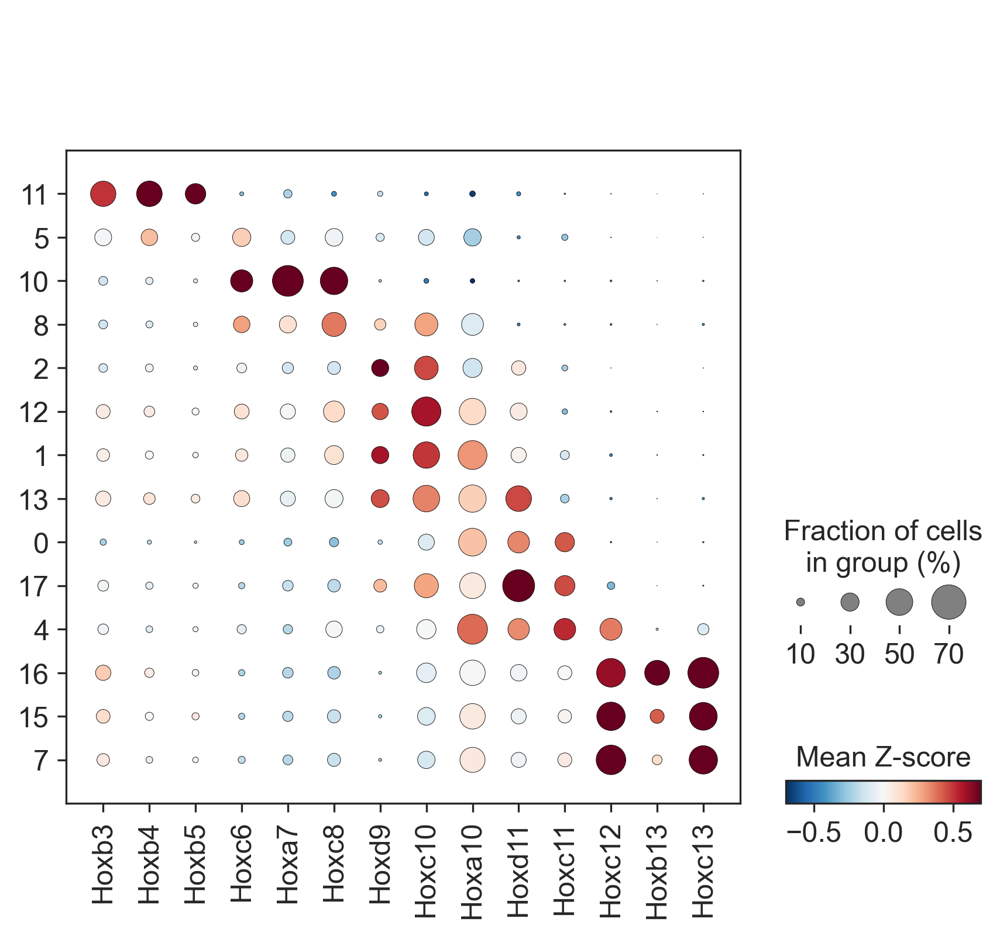

In [311]:
from scipy.cluster.hierarchy import linkage, dendrogram

genes = np.array([
    "Hoxc13", "Hoxb13", "Hoxc12", "Hoxc11",
    "Hoxd11", "Hoxa10", "Hoxc10", "Hoxd9",
    "Hoxc8", "Hoxa7", "Hoxc6", "Hoxb5",
    "Hoxb4", "Hoxb3"
])

clones_whitelist = list(
    adata.
    obs.
    clones_clusters_2.
    value_counts()[
        adata.obs.clones_clusters_2.value_counts() > 50
    ][1:].
    index
)

adata_plot = adata[
    adata.obs.clones_clusters_2.isin(clones_whitelist),
    genes
]
sc.pp.scale(adata_plot, max_value=10)

adata_plot.obs["clones_clusters_2"] = adata_plot.obs["clones_clusters_2"].cat.reorder_categories(
    ["7", "15", "16", "4", "17", "0", "13", "1", "12", "2", "8", "10", "5", "11"][::-1]
)

sc.pl.dotplot(
    adata_plot,
    var_names=genes[::-1],
    groupby="clones_clusters_2",
    swap_axes=False,
    dendrogram=False,
    cmap="RdBu_r",
    vmax=0.7,
    vmin=-0.7,
    colorbar_title="Mean Z-score",
    dot_max=0.7,
)

Text(0.5, 0, '')

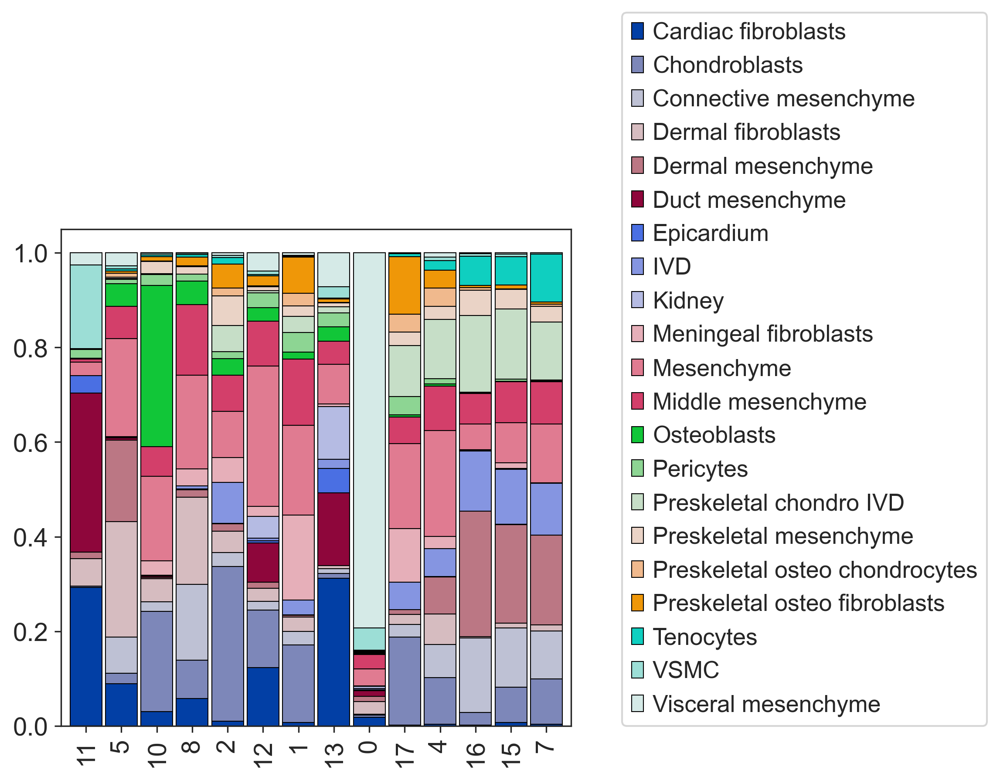

In [313]:
clonal_cluster_count = adata_plot.obs.groupby(["clones_clusters_2", "celltype_l2"]).size().reset_index().pivot(columns="celltype_l2", index="clones_clusters_2", values=0)
clonal_cluster_count = (clonal_cluster_count.T / clonal_cluster_count.sum(axis=1)).T

fig, ax = plt.subplots(figsize=(5, 5))
ax = clonal_cluster_count.plot(kind="bar", stacked=True, width=0.9, edgecolor="black",
                               color=dict(zip(adata.obs.celltype_l2.cat.categories, adata.uns["celltype_l2_colors"])),
                               ax=ax, linewidth=0.5)
ax.legend(loc=(1.1, 0))
ax.set_xlabel("")

In [315]:
adata_whole = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/trunk_E13_clonal_clusters.h5ad")

Text(0.5, 0, '')

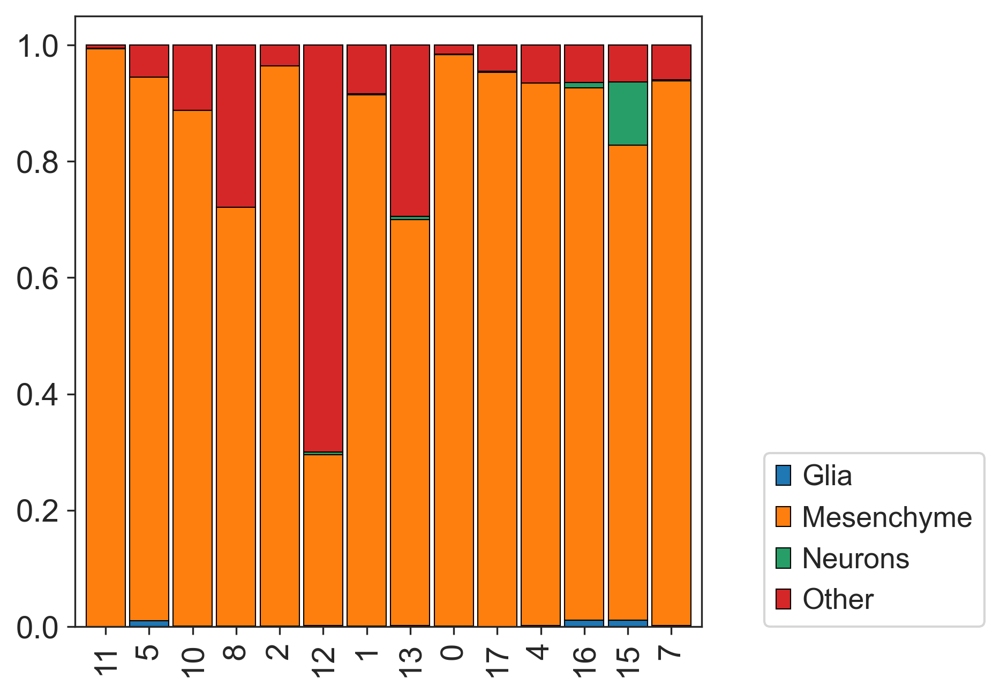

In [318]:
adata_whole = adata_whole[adata_whole.obs.clones_clusters_2.isin(clones_whitelist)]
adata_whole.obs["clones_clusters_2"] = adata_whole.obs["clones_clusters_2"].cat.reorder_categories(
    ["7", "15", "16", "4", "17", "0", "13", "1", "12", "2", "8", "10", "5", "11"][::-1]
)
clonal_cluster_count = adata_whole.obs.groupby(["clones_clusters_2", "celltype_l0"]).size().reset_index().pivot(columns="celltype_l0", index="clones_clusters_2", values=0)
clonal_cluster_count = (clonal_cluster_count.T / clonal_cluster_count.sum(axis=1)).T

fig, ax = plt.subplots(figsize=(5, 5))
ax = clonal_cluster_count.plot(kind="bar", stacked=True, width=0.9, edgecolor="black",
                               color=dict(zip(adata_whole.obs.celltype_l0.cat.categories, adata_whole.uns["celltype_l0_colors"])),
                               ax=ax, linewidth=0.5)
ax.legend(loc=(1.1, 0))
ax.set_xlabel("")

## E9.5

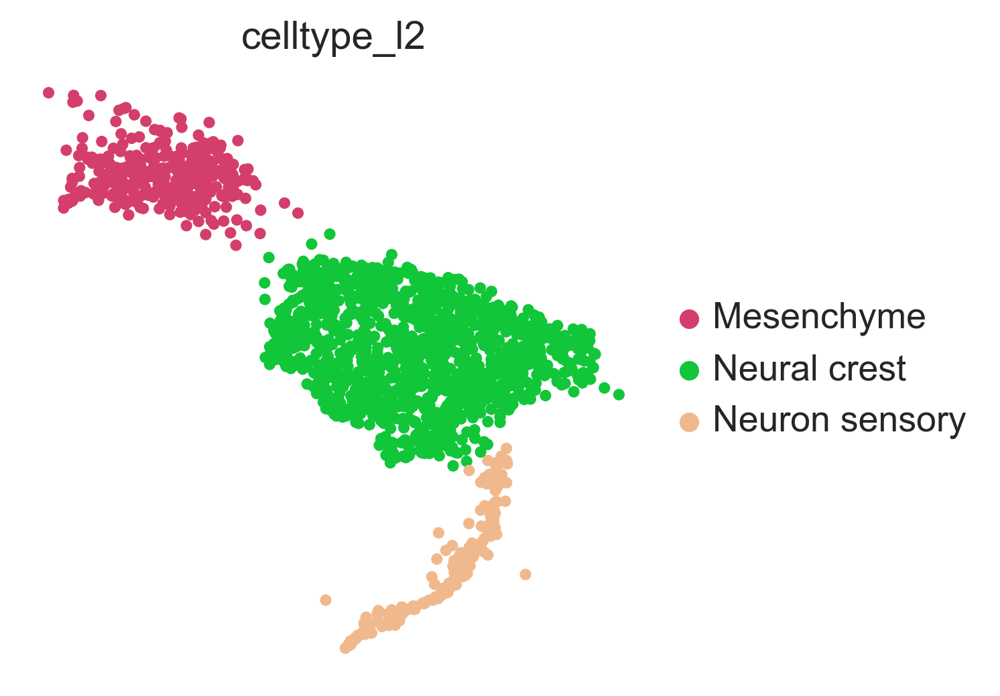

In [27]:
adata = sc.read_h5ad(f"{DATA_PATH}/anndatas/E9_trunk_reference.h5ad")
adata_ncm = adata[adata.obs.celltype_l2.isin(["Neural crest", "Mesenchyme", "Neuron sensory"])]
sc.pl.umap(adata_ncm, color="celltype_l2", frameon=False)

In [40]:
set(df[df["E7.5:clones"] == "injection14:clone_4"]["celltype_l2"])

{'Neural crest', 'Neuron sensory'}

In [61]:
target_clones = {
    "NC+M": [],
    "NC+S": [],
    "NC+S+M": [],
    "NC": [],
}

df = adata_ncm.obs[["E7.5:clones", "celltype_l2"]]

In [62]:
for i in set(list(adata_ncm.obs["E7.5:clones"])):
    ct = set(df[df["E7.5:clones"] == i]["celltype_l2"])
    if ("Neural crest" in ct) and ("Mesenchyme" in ct) and ("Neuron sensory" in ct) and (i != "NA"):
        target_clones["NC+S+M"].append(i)
    elif ("Neural crest" in ct) and ("Mesenchyme" in ct) and not ("Neuron sensory" in ct):
        target_clones["NC+M"].append(i)
    elif ("Neural crest" in ct) and not ("Mesenchyme" in ct) and ("Neuron sensory" in ct):
        target_clones["NC+S"].append(i)

In [63]:
target_clones

{'NC+M': ['injection14:clone_240',
  'injection14:clone_524',
  'injection14:clone_42',
  'injection14:clone_578',
  'injection14:clone_768',
  'injection14:clone_833',
  'injection14:clone_203',
  'injection14:clone_572',
  'injection14:clone_437',
  'injection14:clone_376',
  'injection14:clone_692',
  'injection14:clone_215',
  'injection14:clone_307',
  'injection14:clone_20',
  'injection14:clone_1059',
  'injection14:clone_291',
  'injection14:clone_316',
  'injection14:clone_659',
  'injection14:clone_558'],
 'NC+S': ['injection15:clone_1749',
  'injection14:clone_367',
  'injection15:clone_1002',
  'injection14:clone_109',
  'injection14:clone_681',
  'injection14:clone_1004',
  'injection14:clone_184',
  'injection15:clone_832',
  'injection15:clone_1348',
  'injection14:clone_672',
  'injection15:clone_816',
  'injection14:clone_1338',
  'injection15:clone_228',
  'injection14:clone_1052',
  'injection14:clone_488',
  'injection15:clone_759',
  'injection15:clone_302',
  'inj

<Axes: xlabel='UMAP1', ylabel='UMAP2'>

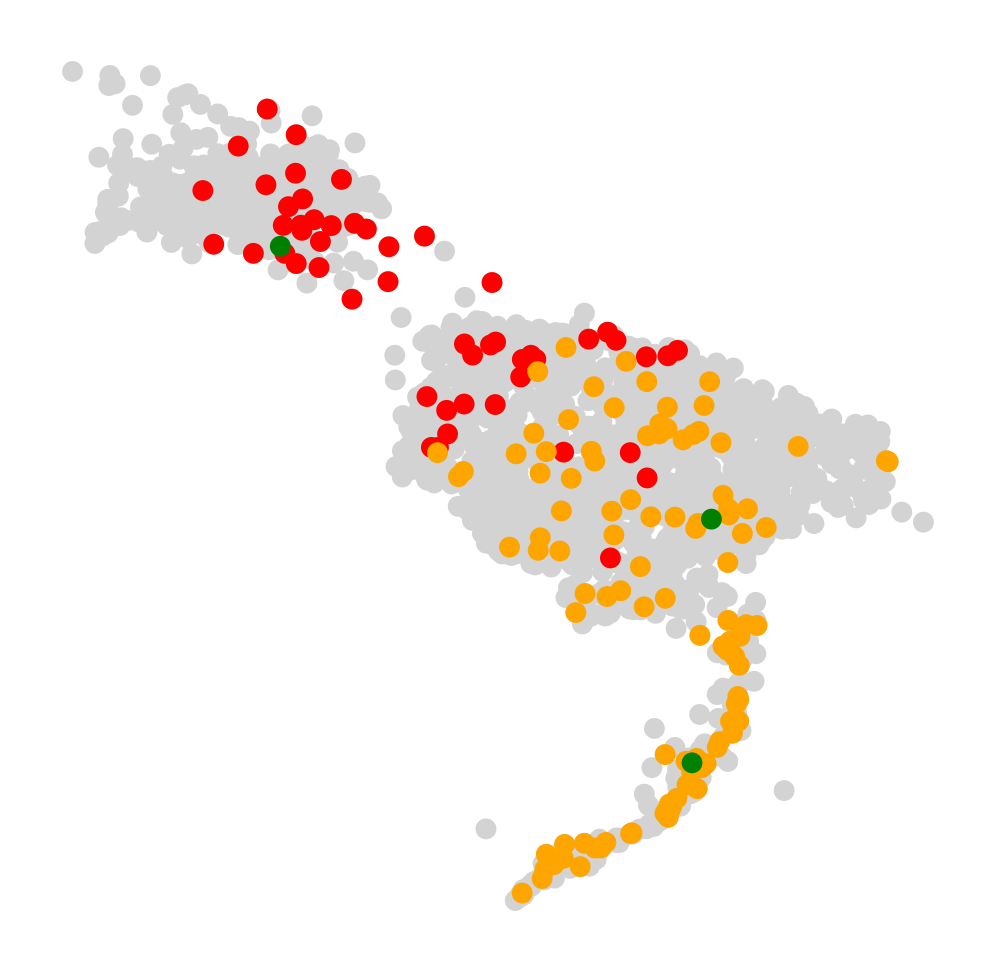

In [64]:
fig, ax = plt.subplots(figsize=(4, 4))

sc.pl.umap(adata_ncm, ax=ax, s=100, show=False, frameon=False)
sc.pl.umap(adata_ncm[adata_ncm.obs["E7.5:clones"].isin(target_clones["NC+M"])], ax=ax, s=100, na_color="red", show=False, frameon=False)
sc.pl.umap(adata_ncm[adata_ncm.obs["E7.5:clones"].isin(target_clones["NC+S"])], ax=ax, s=100, na_color="orange", show=False, frameon=False)
sc.pl.umap(adata_ncm[adata_ncm.obs["E7.5:clones"].isin(target_clones["NC+S+M"])], ax=ax, s=100, na_color="green", show=False, frameon=False)

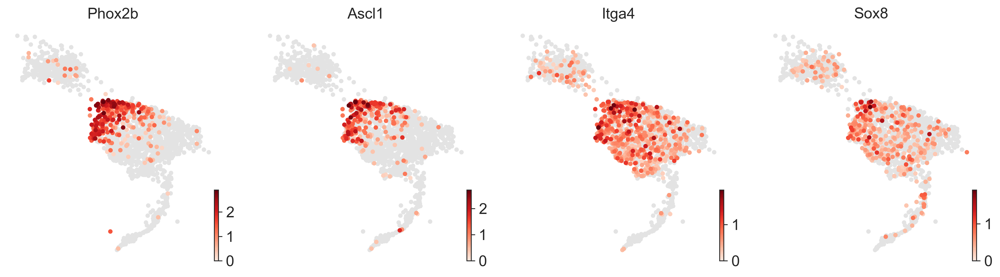

In [73]:
scv.pl.umap(adata_ncm, color=["Phox2b", "Ascl1", "Itga4", "Sox8"], cmap=beautiful_cmap())

In [ ]:
clonal_nn_kwargs = {
    "obs_name": "E7.5:clones",
    "obsm_name": "X_pca_harmony",
    "min_size": 2,
}

adata_clonal = sl.tl.clonal_nn(adata, **clonal_nn_kwargs)
adata_clonal.obs["celltype_l0"] = adata[adata_clonal.obs_names].obs["celltype_l0"]
adata_clonal.obs["celltype_l2"] = adata[adata_clonal.obs_names].obs["celltype_l2"]
        
clones = sl.tl.clone2vec(
    adata_clonal,
    obs_name="E7.5:clones",
    device="cuda:0",
    fill_ct="celltype_l2",
)

sc.pp.neighbors(clones, use_rep="word2vec")
sc.tl.umap(clones)
sc.tl.leiden(clones, resolution=0.5)

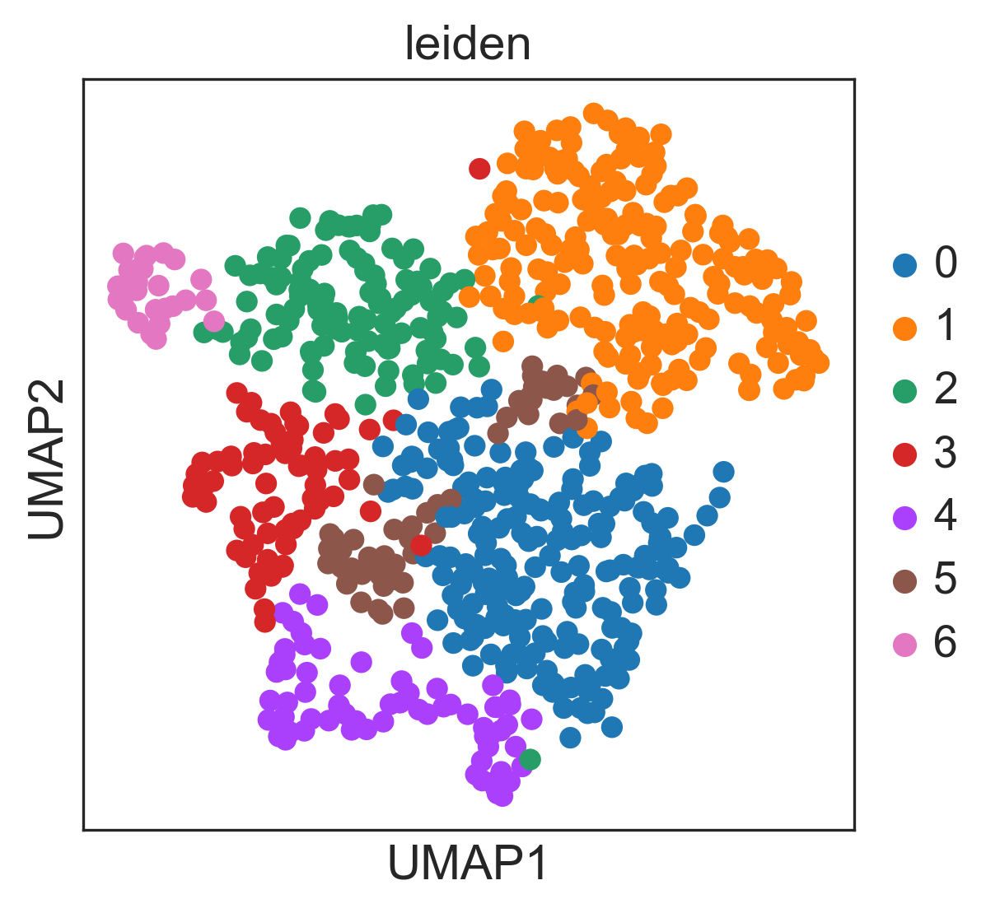

In [189]:
sc.pl.umap(clones, color="leiden")

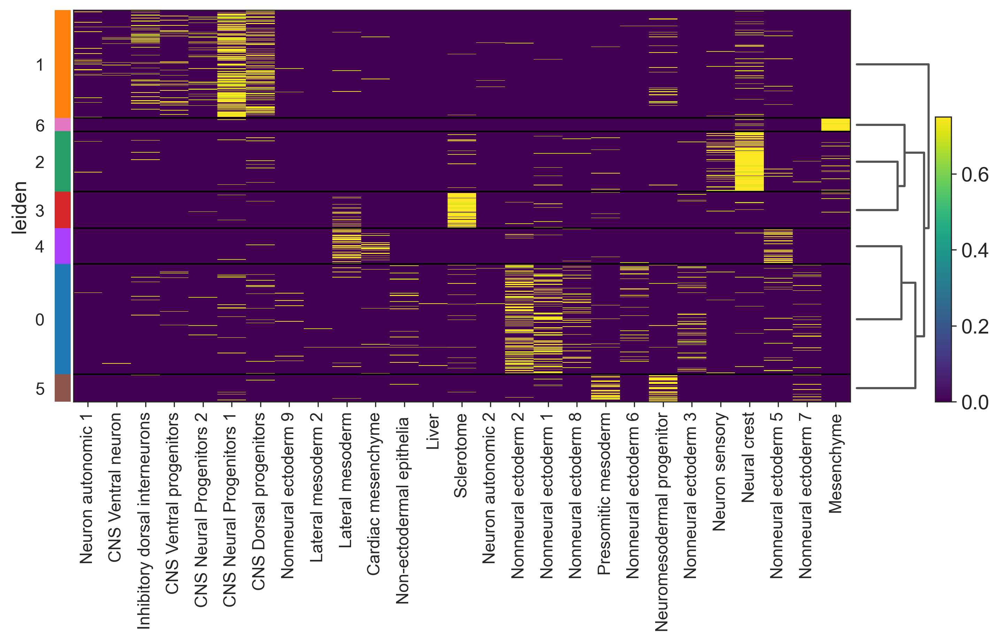

In [198]:
from scipy.cluster.hierarchy import linkage, dendrogram

clones_to_draw = sc.AnnData(
    X=clones.X[:, clones.X.sum(axis=0) > 0],
    obs=clones.obs,
    var=clones.var.loc[clones.var_names[clones.X.sum(axis=0) > 0]]
)

ct_order = dendrogram(linkage(clones_to_draw.X.T, method="single", metric="correlation"), no_plot=True)["leaves"][::-1]
sc.tl.dendrogram(
    clones_to_draw,
    groupby="leiden",
    cor_method="spearman",
    linkage_method="centroid",
    optimal_ordering=True,
)
ax = sc.pl.heatmap(
    clones_to_draw,
    var_names=clones_to_draw.var_names[ct_order],
    groupby="leiden",
    cmap="viridis",
    dendrogram=True,
    figsize=(11, 5),
    #standard_scale="var",
    show=False,
    log=True,
    vmax=0.75,
)

In [199]:
clone_to_cluster = dict(zip(
    clones.obs_names,
    clones.obs[f"leiden"],
))
clone_to_cluster["NA"] = "NA"
adata.obs[f"clones_clusters"] = [
    clone_to_cluster[clone] if clone in clone_to_cluster else "NA"
    for clone in adata.obs["E7.5:clones"] 
]

In [240]:
LIB_DIR = "/home/sergey/tools/mmbench/"
sys.path.append(LIB_DIR)
import mmbench as mb

# Face

In [2]:
adata_m = sc.read_h5ad(f"{DATA_PATH}/anndatas/mesenchyme_face_E13_reference.h5ad")
adata_m = adata_m[~adata_m.obs.celltype_l2.isin(["Doublets", "Doublet"])]

adata_n = sc.read_h5ad(f"{DATA_PATH}/anndatas/neurons_glia_face_E13_reference.h5ad")
adata_n = adata_n[~adata_n.obs.celltype_l2.isin(["Doublets", "Doublet"])]

adata_o = sc.read_h5ad(f"{DATA_PATH}/anndatas/other_cells_face_E13_reference.h5ad")
adata_o = adata_o[~adata_o.obs.celltype_l2.isin(["Doublets", "Doublet"])]

adata = sc.read_h5ad(f"{DATA_PATH}/anndatas/face_E13_reference.h5ad")
adata = adata[~adata.obs.celltype_l2.isin(["Doublets", "Doublet"])]

In [7]:
clonal_nn_kwargs = {
    "obs_name": "clones",
    "obsm_name": "X_pca_harmony",
    "min_size": 5,
}

adata_m_fake = create_fake_anndata(adata_m)
adata_o_fake = create_fake_anndata(adata_o)
adata_n_fake = create_fake_anndata(adata_n)

adata_m_clonal = sl.tl.clonal_nn(adata_m_fake, **clonal_nn_kwargs)
adata_n_clonal = sl.tl.clonal_nn(adata_n_fake, **clonal_nn_kwargs)
adata_o_clonal = sl.tl.clonal_nn(adata_o_fake, **clonal_nn_kwargs)

adata_clonal = adata_m_clonal.concatenate(
    [adata_n_clonal, adata_o_clonal],
    join="outer",
    batch_key=None,
    index_unique=None,
    fill_value=0,
)

for ct in ["celltype_l2", "celltype_l3"]:
    ct_list = []
    for adata_ in [adata_m_fake, adata_n_fake, adata_o_fake]:
        ct_list += list(adata_.obs[ct].astype(str))
    adata_clonal.obs[ct] = ct_list
    adata_clonal.obs[ct] = adata_clonal.obs[ct].astype("category")

clones = sl.tl.clone2vec(
    adata_clonal,
    obs_name=f"clones",
    device="cuda:0",
    fill_ct="celltype_l2",
)

sc.pp.neighbors(clones, use_rep="word2vec")
sc.tl.umap(clones)
clones.obs["injection_time"] = [i.split(":")[0] for i in clones.obs_names]

100%|██████████| 200/200 [25:50<00:00,  7.75s/it]
2023-07-07 01:28:09.975433: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-07 01:28:10.430373: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-07-07 01:28:10.430405: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-07-07 01:28:10.482702: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-07-07 01:28:1

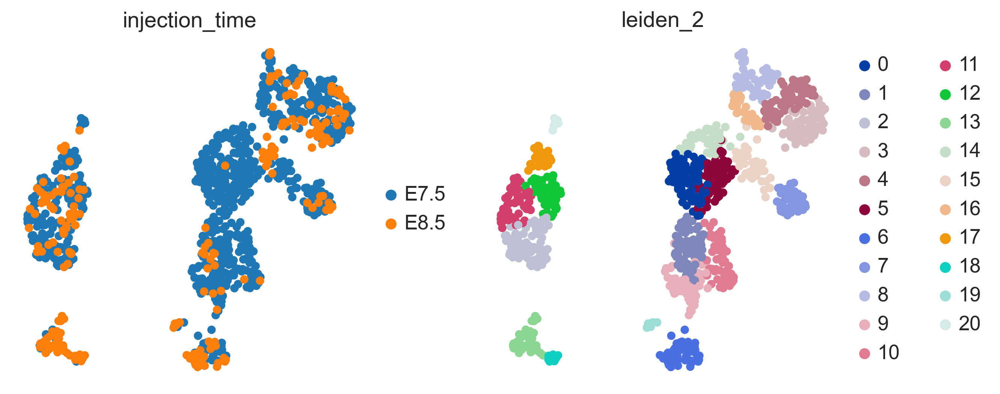

In [8]:
for resolution in [0.5, 1, 2, 3]:
    sc.tl.leiden(
        clones,
        resolution=resolution,
        key_added=f"leiden_{resolution}",
    )
sc.pl.umap(clones, color=["injection_time", "leiden_2"], frameon=False)

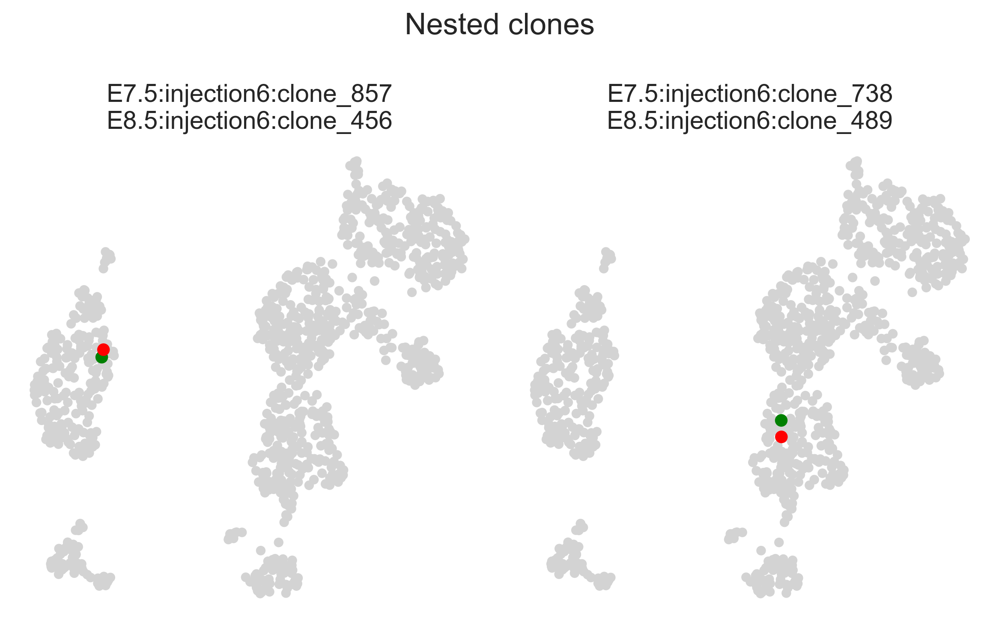

In [9]:
clonal_df = adata.obs[["E7.5:clones", "E8.5:clones"]]
clonal_df["double"] = np.array(clonal_df["E7.5:clones"]) + " + " + np.array(clonal_df["E8.5:clones"])

E7_counts = clonal_df["E7.5:clones"].value_counts()
E8_counts = clonal_df["E8.5:clones"].value_counts()

stats = {}

for injection, counts in zip(clonal_df["double"].value_counts().index, clonal_df["double"].value_counts()):
    if "NA" not in injection:
        GFP, TOM = injection.split(" + ")
        stats[injection] = {
            "(TOM and GFP) / TOM" : counts / E8_counts[TOM],
            "(TOM and GFP) / GFP" : counts / E7_counts[GFP]
        }
        
stats = pd.DataFrame(stats).T
real_DI = stats[stats["(TOM and GFP) / TOM"] > 0.5].index
real_DI = pd.DataFrame({
    "E7.5": ["E7.5:" + i.split(" + ")[0] for i in real_DI],
    "E8.5": ["E8.5:" + i.split(" + ")[1] for i in real_DI]
})

real_DI = real_DI[real_DI["E7.5"].isin(clones.obs_names) & real_DI["E8.5"].isin(clones.obs_names)]

npairs = len(real_DI)
fig, axes = plt.subplots(figsize=(4 * npairs, 5), ncols = npairs)

for i in range(npairs):
    sc.pl.umap(clones, ax=axes[i], show=False, frameon=False)
    sc.pl.umap(clones[list(real_DI.iloc[i])[0]], ax=axes[i],
               show=False, frameon=False, na_color="green", s=200)
    sc.pl.umap(clones[list(real_DI.iloc[i])[1]], ax=axes[i],  title="\n".join(list(real_DI.iloc[i])),
               show=False, frameon=False, na_color="red", s=200)
    
fig.suptitle("Nested clones")
fig.tight_layout()

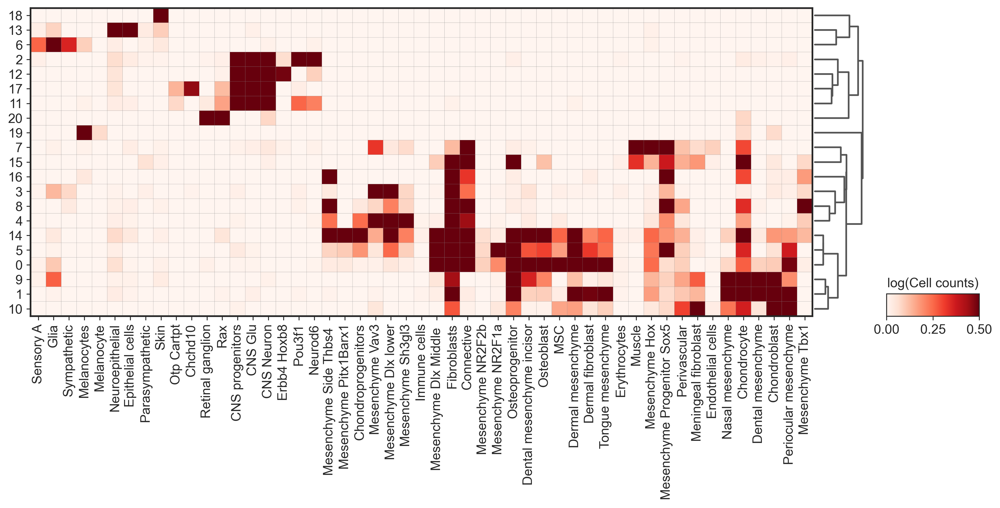

In [12]:
from scipy.cluster.hierarchy import linkage, dendrogram

clones_to_draw = sc.AnnData(
    X=clones.X[:, clones.X.sum(axis=0) > 0],
    obs=clones.obs,
    var=clones.var.loc[clones.var_names[clones.X.sum(axis=0) > 0]]
)

ct_order = dendrogram(linkage(clones_to_draw.X.T, method="average", metric="correlation"), no_plot=True)["leaves"][::-1]
sc.tl.dendrogram(
    clones_to_draw,
    groupby="leiden_2",
    cor_method="spearman",
    linkage_method="centroid",
    optimal_ordering=True,
    use_rep="X",
)
ax = sc.pl.matrixplot(
    clones_to_draw,
    var_names=clones_to_draw.var_names[ct_order],
    groupby="leiden_2",
    cmap="Reds",
    dendrogram=True,
    figsize=(15, 5),
    #standard_scale="var",
    show=False,
    log=True,
    vmax=0.5,
    colorbar_title="log(Cell counts)"
)

In [13]:
for resolution in [0.5, 1, 2, 3]: 
    clone_to_cluster = dict(zip(
        clones.obs_names,
        clones.obs[f"leiden_{resolution}"],
    ))
    clone_to_cluster["NA"] = "NA"
    for adata_ in [adata, adata_m, adata_n, adata_o]:
        adata_.obs["clones"] = concat_clones(adata_.obs[["E7.5:clones", "E8.5:clones"]])
        adata_.obs[f"clones_clusters_{resolution}"] = [
            clone_to_cluster[clone] if clone in clone_to_cluster else "NA"
            for clone in adata_.obs["clones"] 
        ]

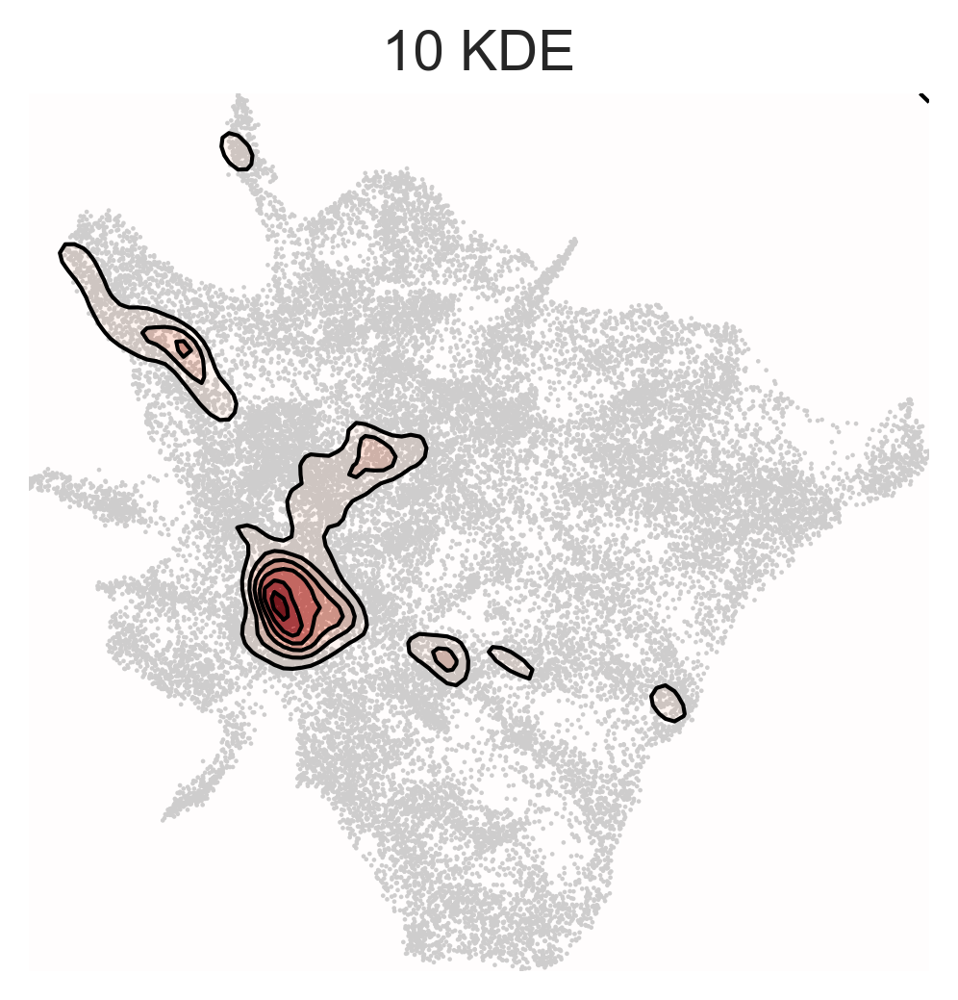

In [15]:
sl.pl.kde(
    adata_m,
    groupby=f"clones_clusters_1",
    group="10",
)

In [16]:
adata_single = sc.read_h5ad("/home/sergey/data/clonal_project/cellxgene/clonal_clusters/face_E13_clonal_clusters.h5ad")
adata_m_single = sc.read_h5ad("/home/sergey/data/clonal_project/cellxgene/clonal_clusters/face_mes_E13_clonal_clusters.h5ad")
adata_n_single = sc.read_h5ad("/home/sergey/data/clonal_project/cellxgene/clonal_clusters/face_neur_E13_clonal_clusters.h5ad")
adata_o_single = sc.read_h5ad("/home/sergey/data/clonal_project/cellxgene/clonal_clusters/face_other_E13_clonal_clusters.h5ad")

In [17]:
for res in [0.5, 1, 2]:
    adata_single.obs[f"clones_clusters_{res}"] = adata.obs[f"clones_clusters_{res}"].copy()
    adata_m_single.obs[f"clones_clusters_{res}"] = adata_m.obs[f"clones_clusters_{res}"].copy()
    adata_n_single.obs[f"clones_clusters_{res}"] = adata_n.obs[f"clones_clusters_{res}"].copy()
    adata_o_single.obs[f"clones_clusters_{res}"] = adata_o.obs[f"clones_clusters_{res}"].copy()

In [18]:
adata_single.raw.to_adata().write_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_face_E13/face_E13_clonal_clusters.h5ad")
adata_m_single.raw.to_adata().write_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_face_E13/face_mes_E13_clonal_clusters.h5ad")
adata_n_single.raw.to_adata().write_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_face_E13/face_neur_E13_clonal_clusters.h5ad")
adata_o_single.raw.to_adata().write_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_face_E13/face_other_E13_clonal_clusters.h5ad")

clones.write_h5ad(f"/home/sergey/data/clonal_project/anndatas/merged_clones_face_E13/E13_face_clonal_embedding.h5ad")

# Illustration

In [5]:
clones = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/E13_clonal_embedding.h5ad")
adata = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/trunk_E13_clonal_clusters.h5ad")

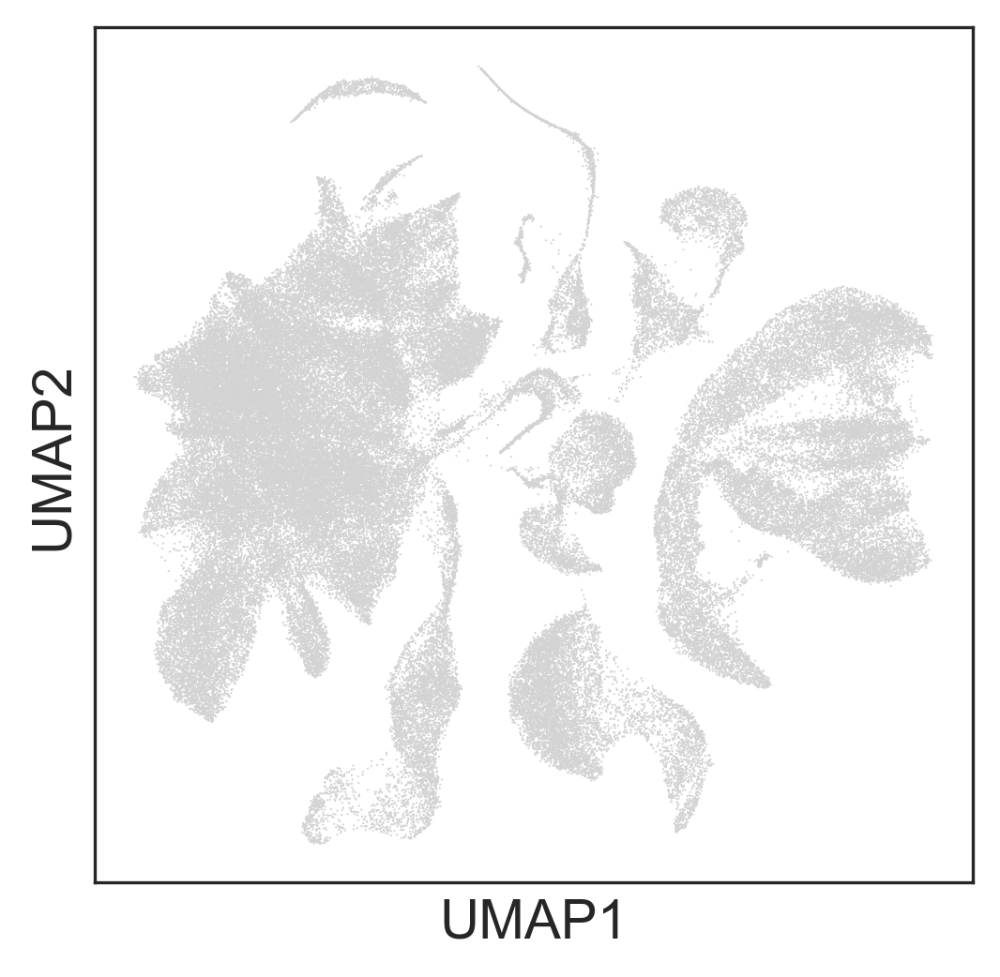

In [6]:
sc.pl.umap(adata)

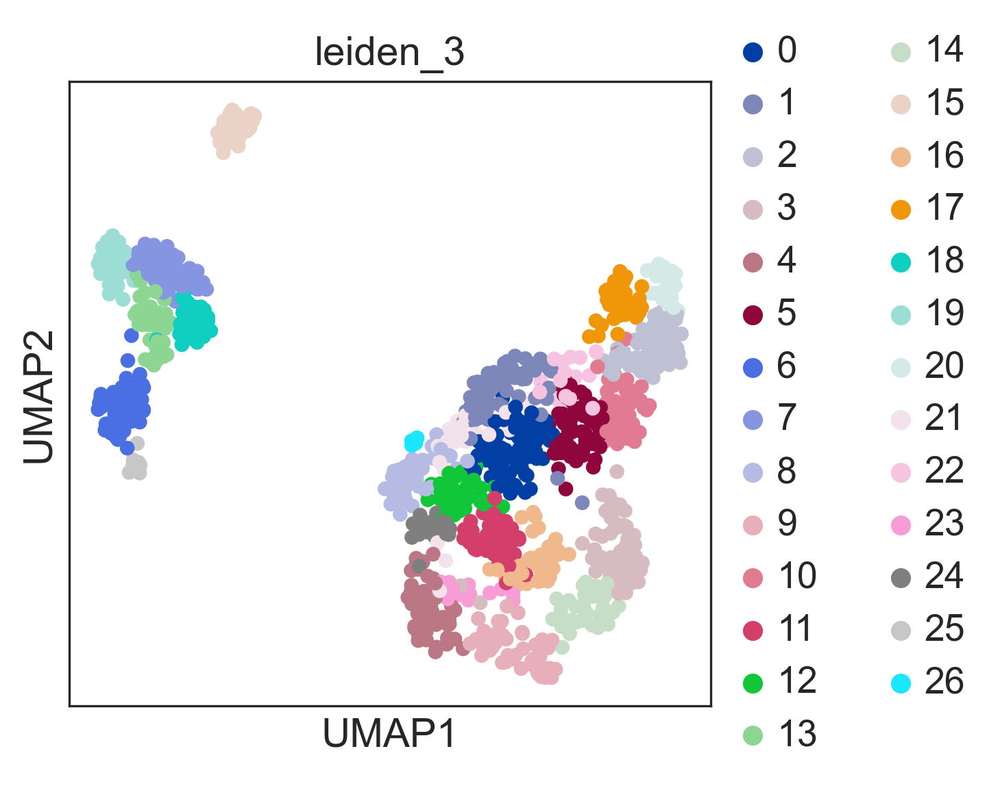

In [34]:
sc.pl.umap(clones, color="leiden_3", layer="frequencies")

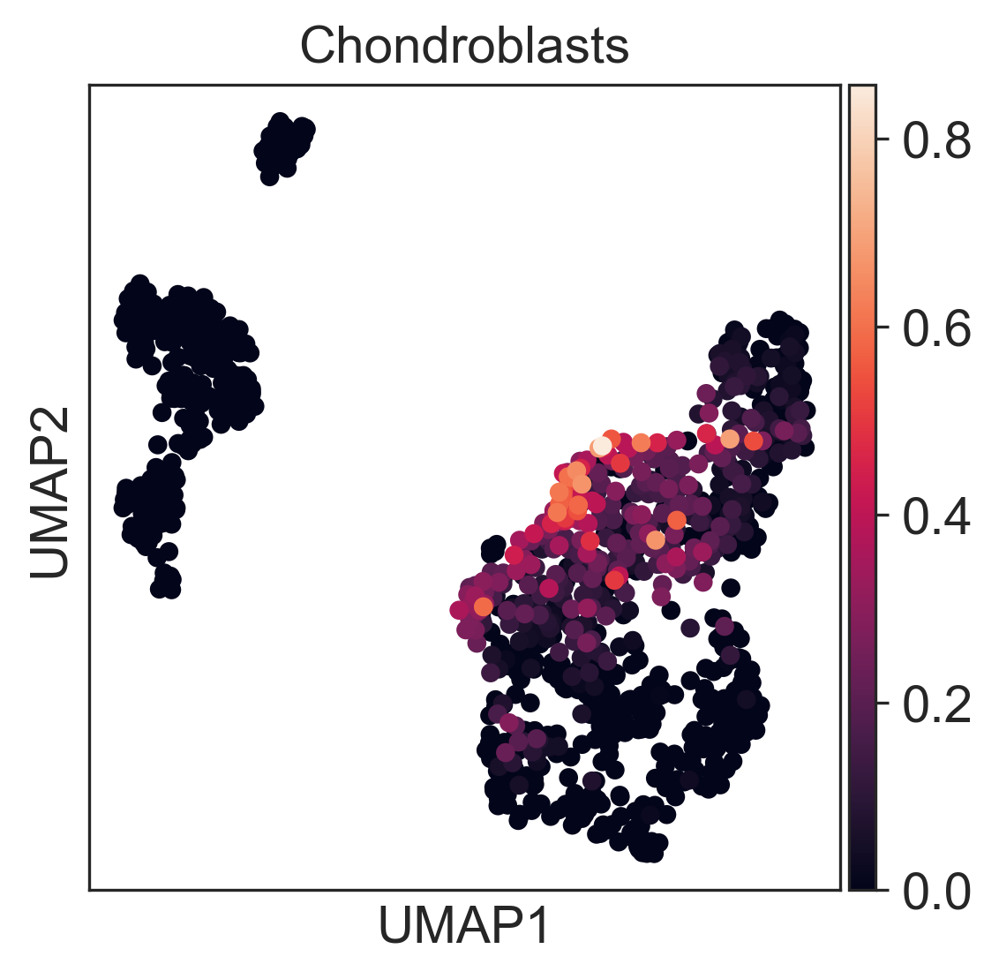

In [32]:
sc.pl.umap(clones, color="Chondroblasts", layer="frequencies")

Index(['E7.5:injection6:clone_0', 'E7.5:injection6:clone_104',
       'E7.5:injection6:clone_106', 'E7.5:injection6:clone_135',
       'E7.5:injection6:clone_164', 'E7.5:injection6:clone_4',
       'E7.5:injection6:clone_42', 'E7.5:injection6:clone_46',
       'E7.5:injection6:clone_55', 'E7.5:injection6:clone_61',
       'E7.5:injection7:clone_118', 'E7.5:injection7:clone_148',
       'E7.5:injection7:clone_173', 'E7.5:injection7:clone_2',
       'E7.5:injection7:clone_67', 'E7.5:injection7:clone_86',
       'E8.5:injection2:clone_1003', 'E8.5:injection2:clone_1018',
       'E8.5:injection2:clone_1025', 'E8.5:injection2:clone_1043',
       'E8.5:injection2:clone_1066', 'E8.5:injection2:clone_1068',
       'E8.5:injection2:clone_1077', 'E8.5:injection2:clone_1099',
       'E8.5:injection2:clone_1101', 'E8.5:injection2:clone_1103',
       'E8.5:injection2:clone_1114', 'E8.5:injection2:clone_1116',
       'E8.5:injection2:clone_1127', 'E8.5:injection2:clone_1129',
       'E8.5:injection2

<Axes: xlabel='UMAP1', ylabel='UMAP2'>

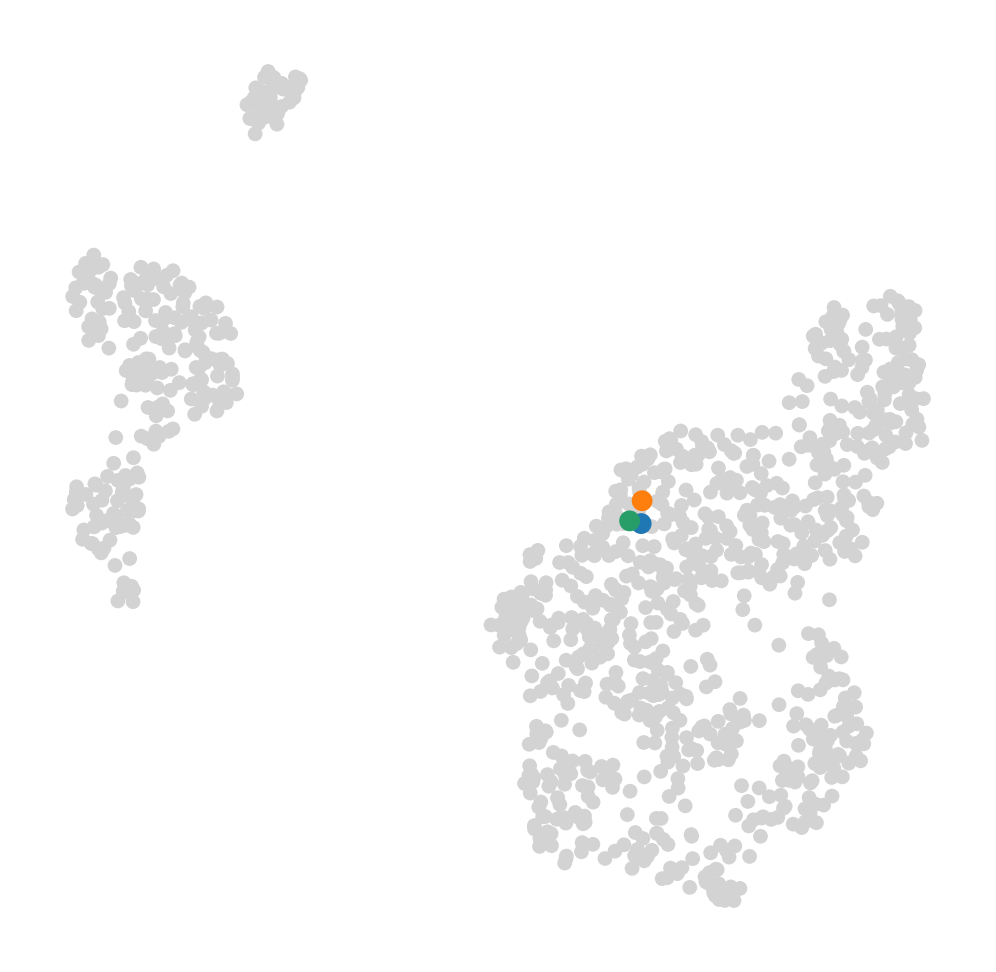

In [82]:
fig, ax = plt.subplots(figsize=(4, 4))

colors = sns.color_palette()
clone_1 = clones[clones.obs.leiden_3 == "1"].obs_names[0]
clone_2 = clones[clones.obs.leiden_3 == "1"].obs_names[3]
clone_3 = clones[clones.obs.leiden_3 == "1"].obs_names[4]

sc.pl.umap(clones, frameon=False, ax=ax, show=False, s=50)
sc.pl.umap(clones[clones.obs_names == clone_1], frameon=False, ax=ax, show=False, na_color=colors[0], s=100)
sc.pl.umap(clones[clones.obs_names == clone_2], frameon=False, ax=ax, show=False, na_color=colors[1], s=100)
sc.pl.umap(clones[clones.obs_names == clone_3], frameon=False, ax=ax, show=False, na_color=colors[2], s=100)

(-0.5, 1.5)

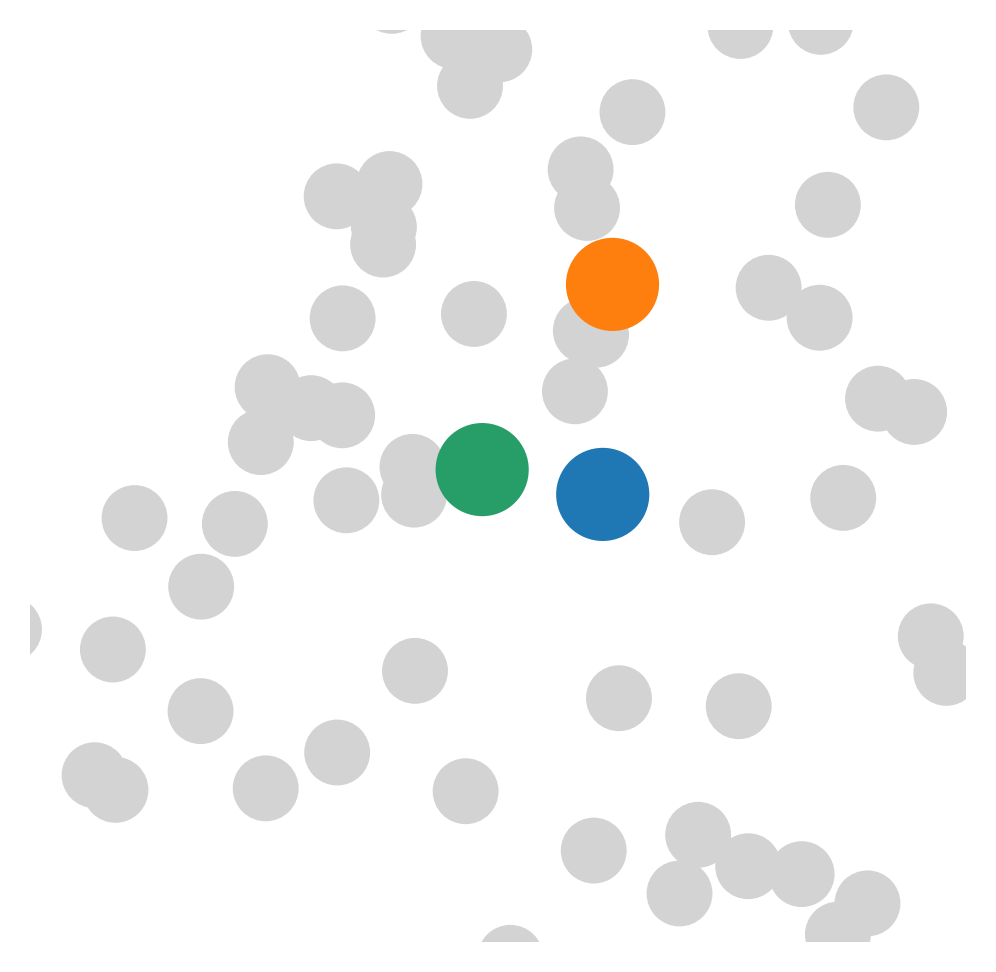

In [117]:
fig, ax = plt.subplots(figsize=(4, 4))

colors = sns.color_palette()
clone_1 = clones[clones.obs.leiden_3 == "1"].obs_names[0]
clone_2 = clones[clones.obs.leiden_3 == "1"].obs_names[3]
clone_3 = clones[clones.obs.leiden_3 == "1"].obs_names[4]

sc.pl.umap(clones, frameon=False, ax=ax, show=False, s=1000)
sc.pl.umap(clones[clones.obs_names == clone_1], frameon=False, ax=ax, show=False, na_color=colors[0], s=2000)
sc.pl.umap(clones[clones.obs_names == clone_2], frameon=False, ax=ax, show=False, na_color=colors[1], s=2000)
sc.pl.umap(clones[clones.obs_names == clone_3], frameon=False, ax=ax, show=False, na_color=colors[2], s=2000)

ax.set_xlim(9.5, 11.5)
ax.set_ylim(-0.5, 1.5)

<Axes: xlabel='UMAP1', ylabel='UMAP2'>

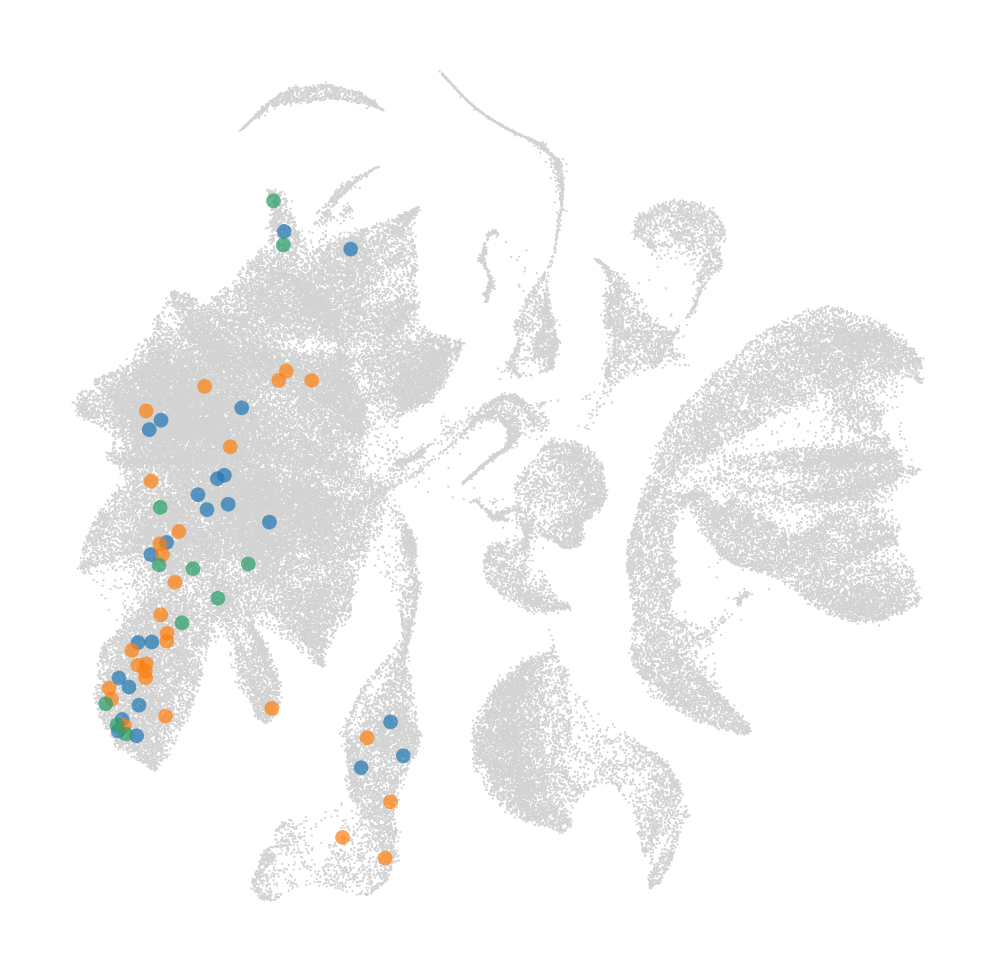

In [78]:
fig, ax = plt.subplots(figsize=(4, 4))

sc.pl.umap(adata, frameon=False, ax=ax, show=False)
sc.pl.umap(adata[adata.obs["E7.5:clones"] == clone_1[5:]], frameon=False, ax=ax,
           show=False, na_color=colors[0], s=50, alpha=0.7)
sc.pl.umap(adata[adata.obs["E7.5:clones"] == clone_2[5:]], frameon=False, ax=ax,
           show=False, na_color=colors[1], s=50, alpha=0.7)
sc.pl.umap(adata[adata.obs["E7.5:clones"] == clone_3[5:]], frameon=False, ax=ax,
           show=False, na_color=colors[2], s=50, alpha=0.7)

'injection6:clone_0'